# NB 3 | Visualization
---
## Project:
Amazon Reviews Analysis (DSC 400)

## Dataset: 
Original: SAHITYA SAHU Amazon Large Dataset (~123GB) Sampled & Cleaned: Amazon_Master_Cleaned.csv (129794, 27)

## NB Objective: 
Create static and interactive visualization using the cleaned & FE dataset

**Tasks:**
1. Static Visuals:
2. Interactive Visuals:
3. Dashboard (Best visuals):

## Setup & Load
---

In [1]:
#Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

#For Plots
sns.set_style("whitegrid")

In [2]:
#Load FE dataset
df_master = pd.read_csv("Amazon_FE_Dataset.csv")
print("Dataset shape:", df_master.shape)
df_master.head()

Dataset shape: (129794, 27)


,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,...,sentiment_polarity,sentiment_subjectivity,has_image,review_year,review_month,review_dayofweek,reviews_per_reviewer,reviews_per_product,avg_rating_product,avg_rating_reviewer
0,4,True,2017-05-09,A2VY416R3G7WD9,B0012XPRO8,Becky Ann Hathaway,i really liked this product. never really bou...,super soft,1494288000,0.0,...,0.250000,0.500000,0,2017,5,1,1,5,4.0,4.0
1,4,True,2016-06-25,A3CHVIU4GFE180,B00J9MJDFS,Anais,Have not used this item but a couple of times....,Nice product to have as it does several things...,1466812800,2.0,...,0.300000,0.500000,0,2016,6,5,1,1,4.0,4.0
2,4,True,2014-10-10,AT5L0D757JA4W,B0054EU4Z8,Luxdelux,Great cap but it doesn't really stay on my hea...,Four Stars,1412899200,0.0,...,0.400000,0.450000,0,2014,10,4,1,5,2.6,4.0
3,5,True,2013-03-03,A30X02Q6TP9G3N,B003CU26SY,sag412,I read this would help with my thinning edges....,Great!,1362268800,0.0,...,-0.150000,0.708333,0,2013,3,6,1,4,4.0,5.0
4,5,True,2017-03-01,A2V16V9O1JR53A,B01GOY8LBA,N P Hoca,My dad needed this bucket. He is 94 and in a...,"But he LOVED THIS, and told everyone how great...",1488326400,5.0,...,0.417593,0.620370,0,2017,3,2,1,1,5.0,5.0


### Visual Set 1 | Static Style
---
1. Distribution of Ratings
2. Review Length v Rating (Boxplot)
3. Sentiment Polarity by Rating (Boxplot)
4. Rating Distribution (Pie Chart)
5. Verified v Non-Verified Purchases (Barplot)
6. Reviews w & w/out images (Barplot)
7. Review Length (Histogram)
8. Average Setiment Polarity (Histogram)
9. Reviews Over the Years
10. Top 5 Products by Number of Reviews (Barplot)
11. Reviews Per Product Distribution (Histogram)

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\2668109257.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='cividis')


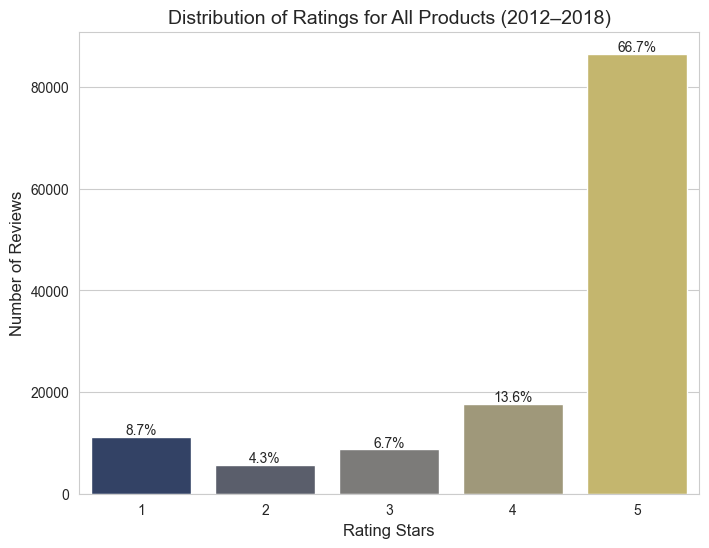

In [3]:
#Static Version

#Counts and %
rating_counts = df_master['overall'].value_counts().sort_index()
rating_perc = 100 * rating_counts / rating_counts.sum()

#Plot
plt.figure(figsize=(8,6))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='cividis')
plt.title("Distribution of Ratings for All Products (2012–2018)", fontsize=14)
plt.xlabel("Rating Stars", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)

for rating, count in rating_counts.items():
    perc = rating_perc[rating]
    plt.text(rating-1, count + 500, f"{perc:.1f}%", ha='center', fontsize=10)

plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\1587598213.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='overall', y='review_length', data=df_master, palette='coolwarm')


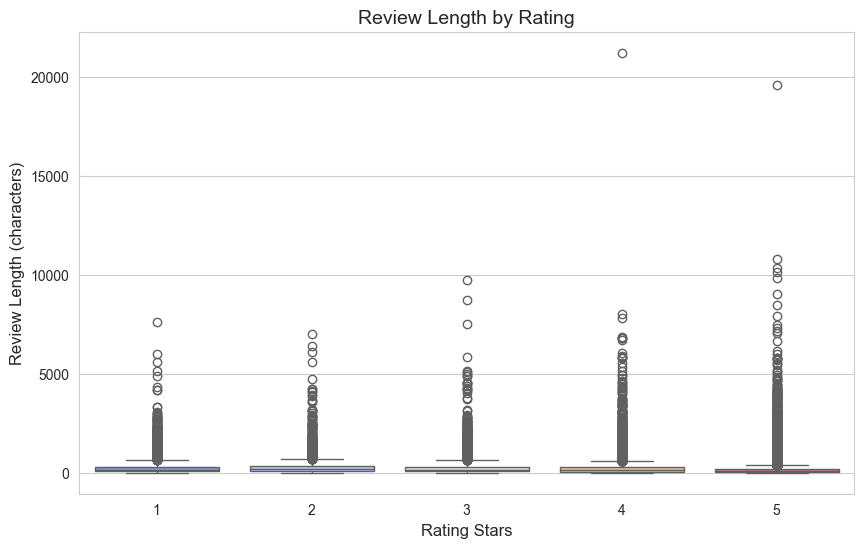

In [4]:
#Review length v rating
plt.figure(figsize=(10,6))
sns.boxplot(x='overall', y='review_length', data=df_master, palette='coolwarm')
plt.title("Review Length by Rating", fontsize=14)
plt.xlabel("Rating Stars", fontsize=12)
plt.ylabel("Review Length (characters)", fontsize=12)
plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\2441038993.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='overall', y='sentiment_polarity', data=df_master, palette='magma')


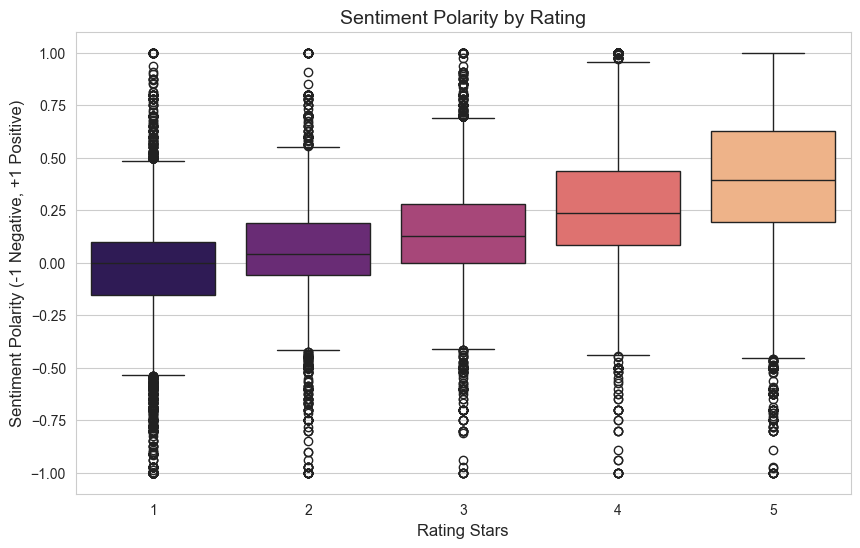

In [5]:
#Sentiment Polarity by Rating
plt.figure(figsize=(10,6))
sns.boxplot(x='overall', y='sentiment_polarity', data=df_master, palette='magma')
plt.title("Sentiment Polarity by Rating", fontsize=14)
plt.xlabel("Rating Stars", fontsize=12)
plt.ylabel("Sentiment Polarity (-1 Negative, +1 Positive)", fontsize=12)
plt.show()

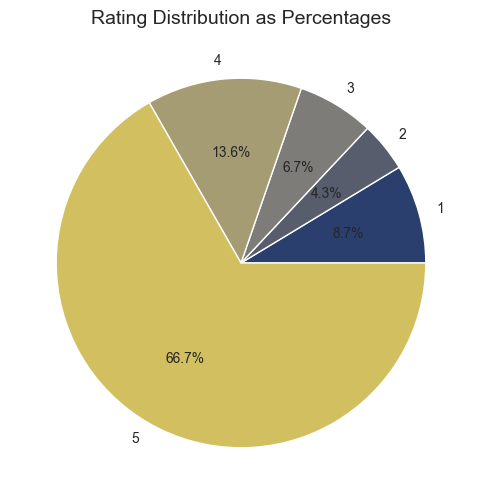

In [6]:
#Rating Dis. : Pie chart
plt.figure(figsize=(6,6))
plt.pie(rating_counts, labels=rating_counts.index, autopct='%1.1f%%', colors=sns.color_palette('cividis', 5))
plt.title("Rating Distribution as Percentages", fontsize=14)
plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\628820242.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=verified_counts.index, y=verified_counts.values, palette='Set2')


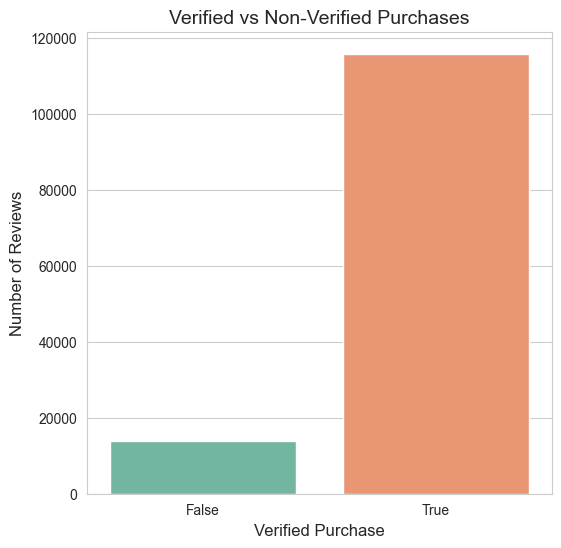

In [7]:
#Verified v non. verified (purchases)
verified_counts = df_master['verified'].value_counts()
plt.figure(figsize=(6,6))
sns.barplot(x=verified_counts.index, y=verified_counts.values, palette='Set2')
plt.title("Verified vs Non-Verified Purchases", fontsize=14)
plt.xlabel("Verified Purchase", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)
plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\2155303374.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=has_image_counts.index, y=has_image_counts.values, palette='Set2')


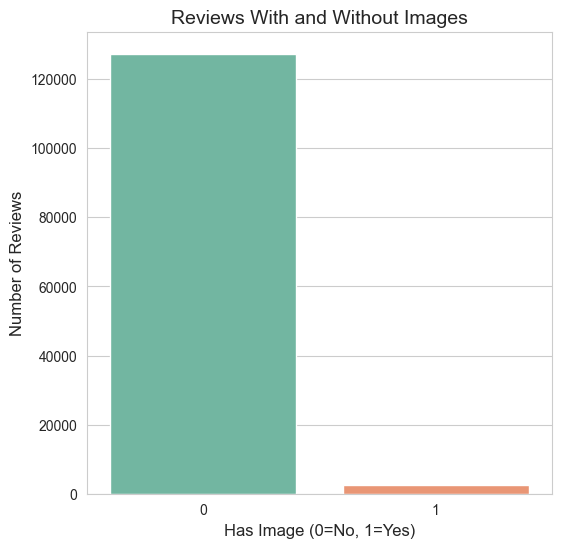

In [8]:
#Reviews Wt & wt out img
has_image_counts = df_master['has_image'].value_counts()
plt.figure(figsize=(6,6))
sns.barplot(x=has_image_counts.index, y=has_image_counts.values, palette='Set2')
plt.title("Reviews With and Without Images", fontsize=14)
plt.xlabel("Has Image (0=No, 1=Yes)", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)
plt.show()

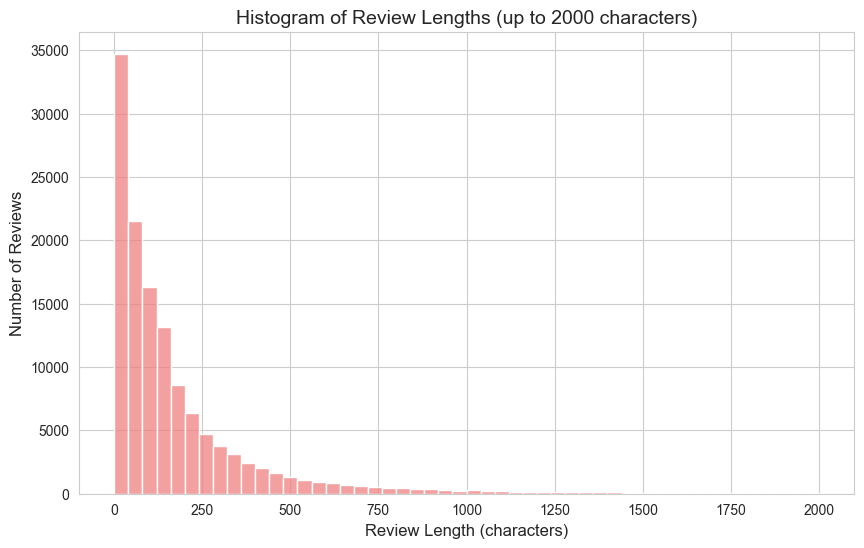

In [9]:
#Review Length
plt.figure(figsize=(10,6))
sns.histplot(df_master[df_master['review_length'] <= 2000]['review_length'], bins=50, color='lightcoral')
plt.title("Histogram of Review Lengths (up to 2000 characters)", fontsize=14)
plt.xlabel("Review Length (characters)", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)
plt.show()

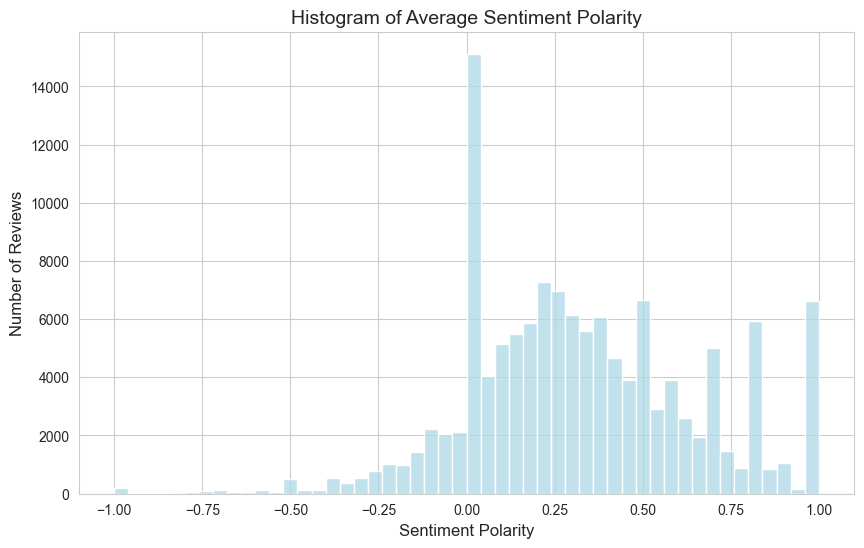

In [10]:
#Average Sentiment Polarity
plt.figure(figsize=(10,6))
sns.histplot(df_master['sentiment_polarity'], bins=50, color='lightblue')
plt.title("Histogram of Average Sentiment Polarity", fontsize=14)
plt.xlabel("Sentiment Polarity", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)
plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\816382826.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='review_year', data=df_years, palette='Spectral', order=sorted(df_years['review_year'].unique()))


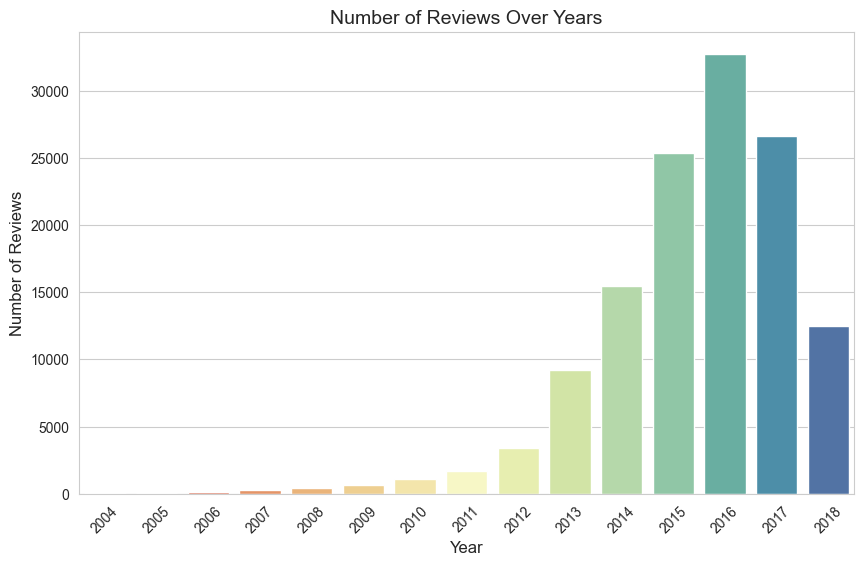

In [11]:
#Reviews over years
plt.figure(figsize=(10,6))
df_years = df_master[df_master['review_year'] >= 2004]
sns.countplot(x='review_year', data=df_years, palette='Spectral', order=sorted(df_years['review_year'].unique()))
plt.title("Number of Reviews Over Years", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)
plt.xticks(rotation=45)
plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\1367140504.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top5_products.values, y=top5_products.index, palette='rocket')


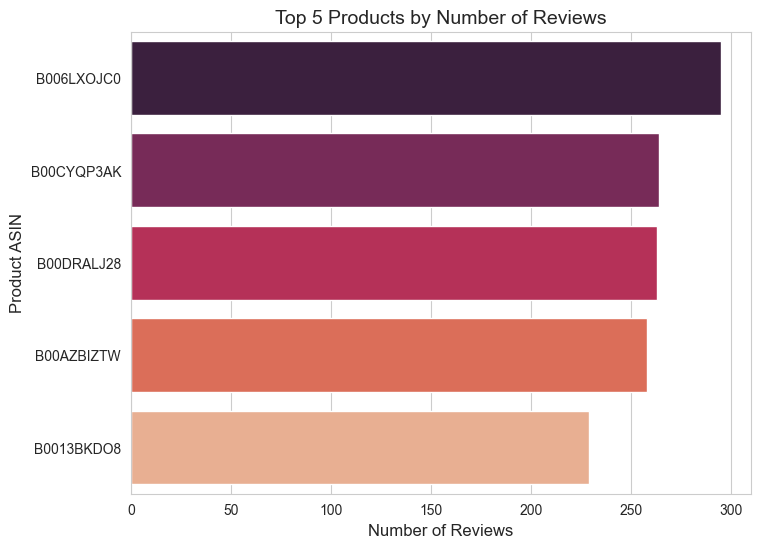

In [12]:
#Top 5 products by number of reviews
top5_products = df_master.groupby('asin')['reviewText'].count().sort_values(ascending=False).head(5)
plt.figure(figsize=(8,6))
sns.barplot(x=top5_products.values, y=top5_products.index, palette='rocket')
plt.title("Top 5 Products by Number of Reviews", fontsize=14)
plt.xlabel("Number of Reviews", fontsize=12)
plt.ylabel("Product ASIN", fontsize=12)
plt.show()

C:\Users\lynnm\AppData\Local\Temp\ipykernel_31848\3163740363.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top5_reviewers.values, y=top5_reviewers.index, palette='viridis')


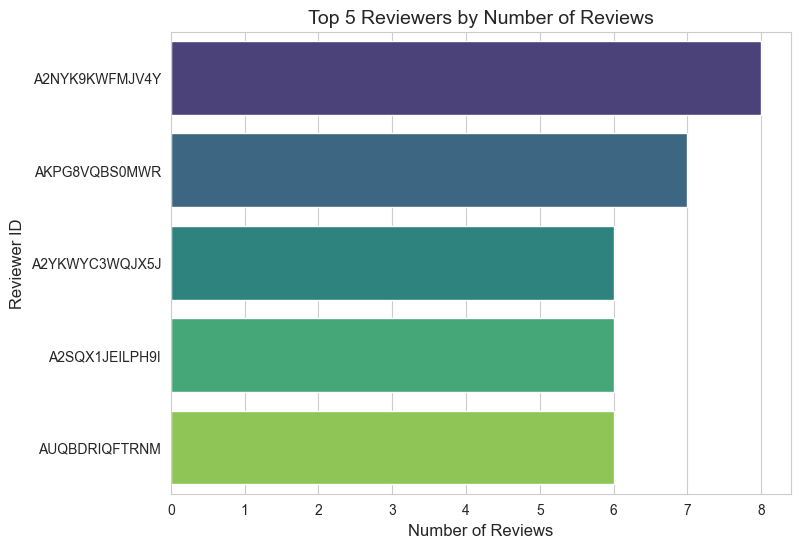

In [13]:
#Top 5 Reviewers by number of reviews
top5_reviewers = df_master.groupby('reviewerID')['reviewText'].count().sort_values(ascending=False).head(5)
plt.figure(figsize=(8,6))
sns.barplot(x=top5_reviewers.values, y=top5_reviewers.index, palette='viridis')
plt.title("Top 5 Reviewers by Number of Reviews", fontsize=14)
plt.xlabel("Number of Reviews", fontsize=12)
plt.ylabel("Reviewer ID", fontsize=12)
plt.show()

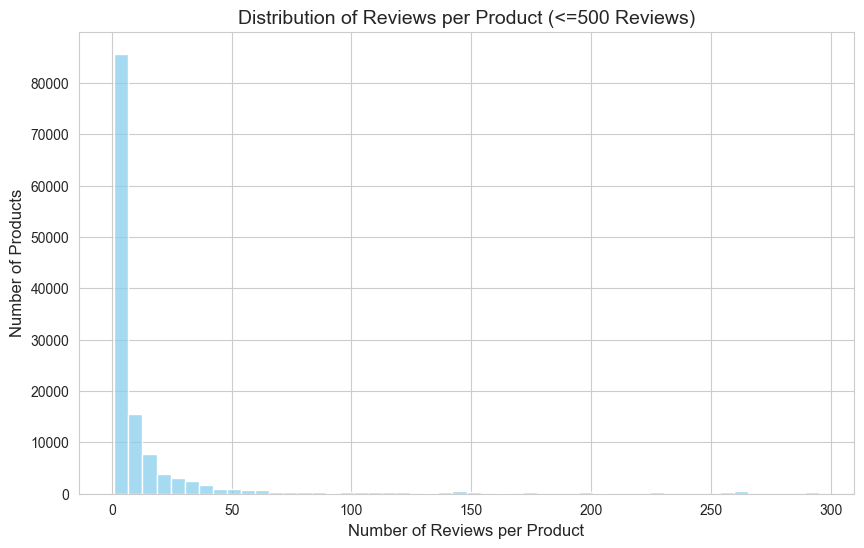

In [14]:
#Reiews per Prod. Dis.
filtered_products = df_master[df_master['reviews_per_product'] <= 500]

plt.figure(figsize=(10,6))
sns.histplot(filtered_products['reviews_per_product'], bins=50, color='skyblue')
plt.title("Distribution of Reviews per Product (<=500 Reviews)", fontsize=14)
plt.xlabel("Number of Reviews per Product", fontsize=12)
plt.ylabel("Number of Products", fontsize=12)
plt.show()

### Visual Set 2 | Interactive
---
1. Distribution of Ratings
2. Review Length v Rating (Boxplot)
3. Sentiment Polarity by Rating (Boxplot)
4. Verified v Non-Verified Purchases (Barplot)
5. Reviews w & w/out images (Barplot)
6. Top 5 Products by Number of Reviews (Barplot)
7. Reviews Per Product Distribution (Histogram)
8. Rating Distribution (Pie Chart)

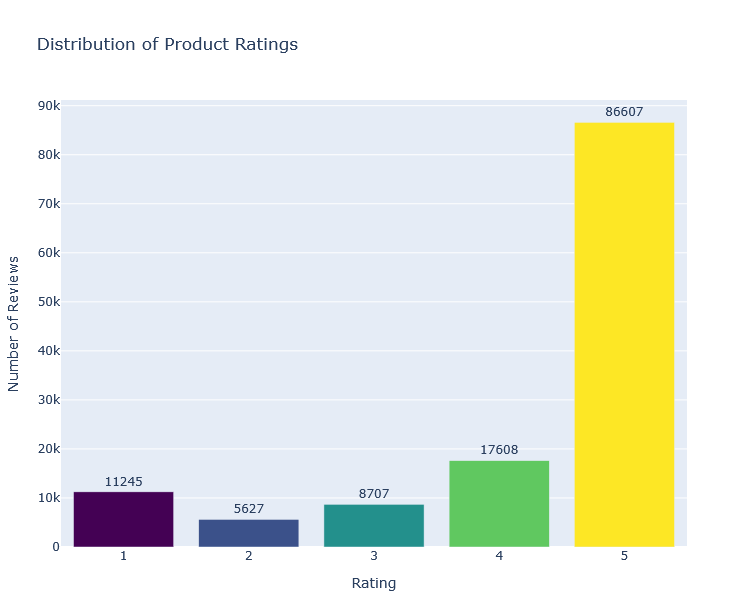

In [15]:
#Repeat to add interaction

rating_counts = df_master['overall'].value_counts().sort_index()

fig_rating = px.bar(
    x=rating_counts.index,
    y=rating_counts.values,
    labels={'x': 'Rating', 'y': 'Number of Reviews'},
    text=rating_counts.values,
    title="Distribution of Product Ratings",
    color=rating_counts.index,
    color_continuous_scale=px.colors.sequential.Viridis
)
fig_rating.update_traces(textposition='outside')
fig_rating.update_layout(
    coloraxis_showscale=False,
    height=600,  # Increase height
    margin=dict(t=100, b=50, l=50, r=50)  # More top margin
)

fig_rating.show()

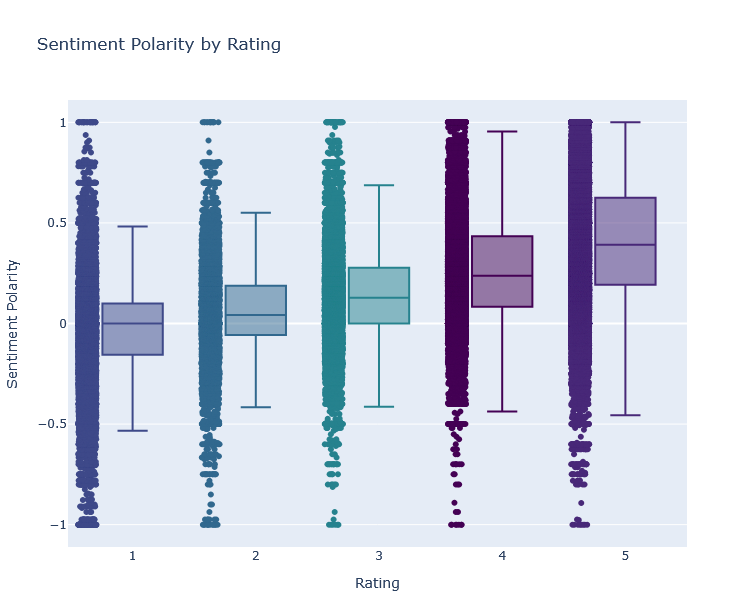

In [16]:
#Sentiment Polarity by rating
fig_sentiment = px.box(
    df_master,
    x='overall',
    y='sentiment_polarity',
    points='all',
    color='overall',
    labels={'overall':'Rating', 'sentiment_polarity':'Sentiment Polarity'},
    title="Sentiment Polarity by Rating",
    color_discrete_sequence=px.colors.sequential.Viridis
)
fig_sentiment.update_layout(showlegend=False, height=600, margin=dict(t=100, b=50, l=50, r=50))
fig_sentiment.show()

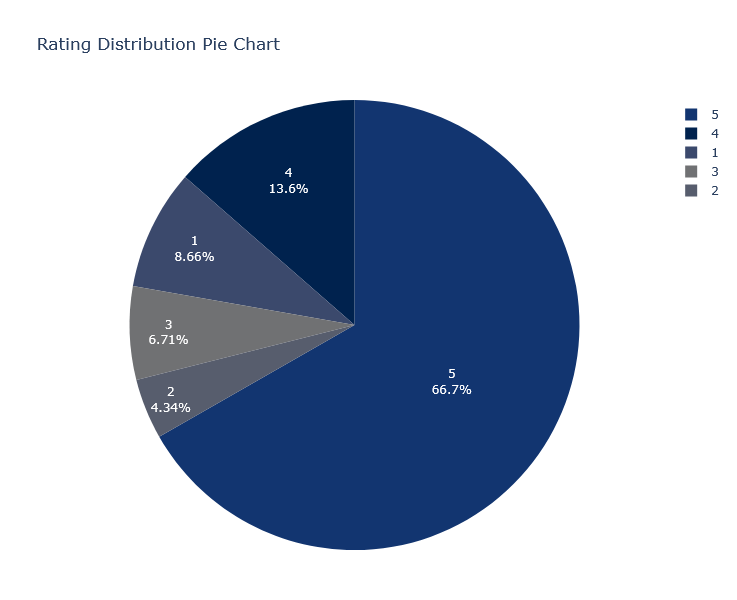

In [17]:
#Rating Distribution Pie Chart
fig_rating_pie = px.pie(
    df_master,
    names='overall',
    title="Rating Distribution Pie Chart",
    color='overall',
    color_discrete_sequence=px.colors.sequential.Cividis
)
fig_rating_pie.update_traces(textinfo='percent+label')
fig_rating_pie.update_layout(height=600, margin=dict(t=100, b=50, l=50, r=50))
fig_rating_pie.show()

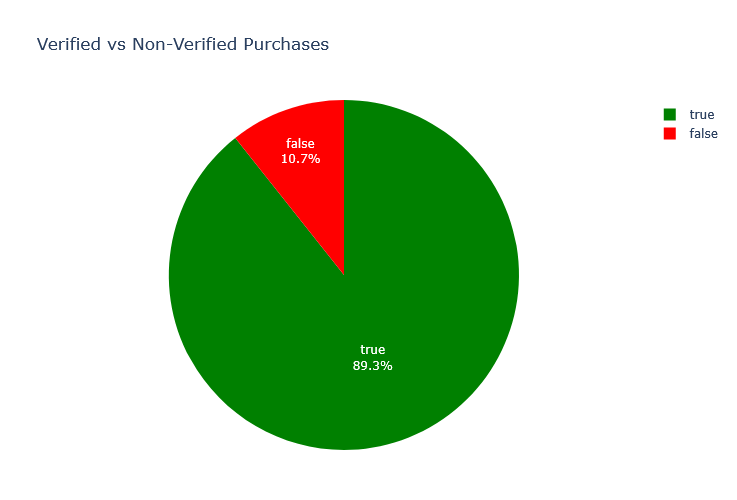

In [18]:
#Verified v Non-Verified Purchases
fig_verified = px.pie(
    df_master,
    names='verified',
    title="Verified vs Non-Verified Purchases",
    color='verified',
    color_discrete_map={True:'green', False:'red'}
)
fig_verified.update_traces(textinfo='percent+label')
fig_verified.update_layout(height=500, margin=dict(t=100, b=50, l=50, r=50))
fig_verified.show()


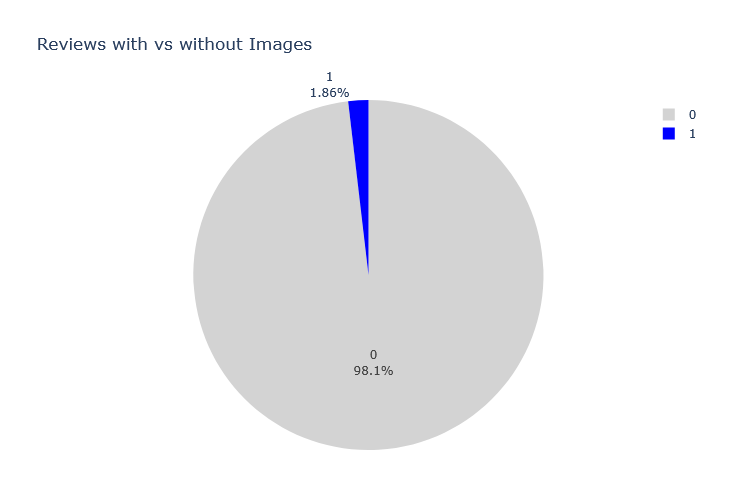

In [19]:
#Reviews wt & wt/out imgs
df_master['has_image'] = df_master['image'].notna().astype(int)
fig_images = px.pie(
    df_master,
    names='has_image',
    title="Reviews with vs without Images",
    color='has_image',
    color_discrete_map={0:'lightgrey',1:'blue'}
)
fig_images.update_traces(textinfo='percent+label')
fig_images.update_layout(height=500, margin=dict(t=100, b=50, l=50, r=50))
fig_images.show()

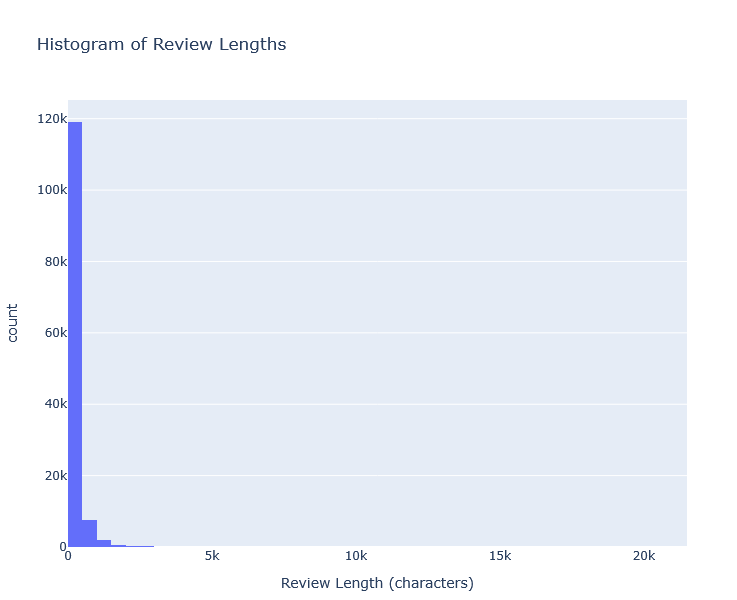

In [20]:
#Review Length Histogram
fig_length_hist = px.histogram(
    df_master,
    x='review_length',
    nbins=50,
    labels={'review_length':'Review Length (characters)','count':'Count'},
    title="Histogram of Review Lengths"
)
fig_length_hist.update_layout(height=600, margin=dict(t=100, b=50, l=50, r=50))
fig_length_hist.show()

## Breakdown of Interactive Charts
---
| Chart Title | Purpose | Insight |
|-------------|---------|---------|
|Distribution of Ratings | Show how many reviews fall into each rating | 5-star dominates|
|Review Length by Rating | Show distribution of review lengths |  Longer reviews in extreme ratings (1 & 5)|
|Sentiment Polarity By Rating | Show relationships between rating & sentiment polarity| Higher ratings corrspond to postive sentiment |
|Reviews per Product Distribution | Shows how many reviews each product has | Many products have few reviews, while a few products have high review counts|
| Rating Distribution Pie Chart | Ratings as percentage of total reviews | Overall balance of ratings|
|Verified v Non-Verified Purchases| Comparison of the two | Mostly true, some false|
|Reviews w & w/out Images | Image for for context |Most reviews do not include images|
|Review Length Histogram | Overall distribution of review lengths | Few outliers |
